# WGAN and DCGAN over FashionMNIST


In this notebook we first implement the network proposed for CIFAR-10 in ["Improved Training of Wasserstein GANs"](https://arxiv.org/abs/1704.00028) by Gulrajani et al. More precisely, we will replicate the simpler architecture used for CIFAR10 (see references) and train it on FashionMNIST. The necessary adaptations will be detailed below.

We will also implement a [DCGAN](https://arxiv.org/pdf/1511.06434.pdf) and compare the performance of both networks.


References:
- The original code (using TensorFlow): the [simpler version](https://github.com/igul222/improved_wgan_training/blob/master/gan_cifar.py). There is also a [residual version](https://github.com/igul222/improved_wgan_training/blob/master/gan_cifar_resnet.py), which is not implemented here.
- A [suggested network for MNIST](https://github.com/igul222/improved_wgan_training/blob/master/gan_mnist.py) by the authors, which we took inspiration from. 
- The WGAN-GP [implementation](https://github.com/EmilienDupont/wgan-gp/blob/master/models.py) by Emilien Dupont.
- The WGAN-GP [implementation](https://github.com/caogang/wgan-gp/blob/master/gan_cifar10.py) by Marvin Cao.
- The [DCGan PyTorch tutorial on Celeb-A](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) by Nathan Inkawhich.

## Setup

### Imports

In [ ]:
#NumPy and PyTorch
import numpy as np
import torch
from torch import nn
from torch import optim
# from torch.nn import functional as F
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.autograd import Variable
from torch.autograd import grad as torch_grad
from torch.utils.data import DataLoader

#Vizualization et al
import datetime
import matplotlib.pyplot as plt
# import random
%tensorflow_version 2.x
from tensorflow import summary
%load_ext tensorboard
import imageio
from tqdm.notebook import tqdm

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### Hyperparameters

The hyperparameters for the WGAN with gradient penalty:

In [ ]:
WGAN_BATCH_SIZE = 64 # Batch size
WGAN_DIM = 128 # Channel depth of (de)convolution layers #TODO try with 64
WGAN_LATENT_DIM = 128 # Dimension of latent space
WGAN_IMG_SIZE = (28,28) # Width and height of dataset images
LAMBDA = 10 # Gradient penalty lambda hyperparameter
WGAN_CRITIC_ITERS = 5 # How many critic iterations per generator iteration
WGAN_ITERS = 3000 # How many critic iterations to train for
WGAN_LR = 1e-4
WGAN_BETAS = (.5, .9) 

DCGAN hyperparameters:

In [ ]:
DCGAN_BATCH_SIZE = WGAN_BATCH_SIZE
DCGAN_EPOCHS = 5
DCGAN_DIM = 64 # Channel depth of (de)convolution layers
DCGAN_IMG_SIZE = 64 #every side
DCGAN_LATENT_DIM = WGAN_LATENT_DIM
DCGAN_LR = 1e-4
DCGAN_BETAS = (.5, .999) 

### WGAN Dataset

Notice we normalize the images so that they fit the generator activation output function's range ( $ -1<tanh(x)<1 $).

In [ ]:
transform_normalize = torchvision.transforms.Compose([
                               torchvision.transforms.ToTensor(),
                               torchvision.transforms.Normalize((0.5), (0.5)),
                           ])

train_data = datasets.FashionMNIST('/fashion_data', train=True, download=True,transform=transform_normalize)
test_data = datasets.FashionMNIST('/fashion_data', train=False, download=True,transform=transform_normalize)
# Create dataloaders
train_loader = DataLoader(train_data, batch_size=WGAN_BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_data, batch_size=WGAN_BATCH_SIZE, shuffle=True)

#TODO remove test?

Extracting /fashion_data/FashionMNIST/raw/train-images-idx3-ubyte.gz to /fashion_data/FashionMNIST/raw



Extracting /fashion_data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /fashion_data/FashionMNIST/raw


Extracting /fashion_data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /fashion_data/FashionMNIST/raw


Extracting /fashion_data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /fashion_data/FashionMNIST/raw
Processing...
Done!


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


We display a few samples from the dataset:

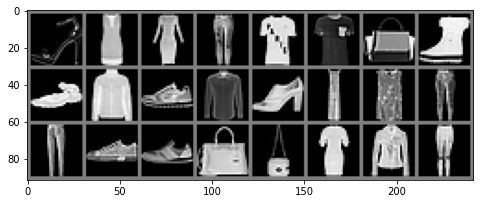

In [ ]:
samples, labels = iter(train_loader).next()
plt.figure(figsize=(8,16))
grid_imgs = torchvision.utils.make_grid(samples[:24])
np_grid_imgs = grid_imgs.numpy()*.5+.5
plt.imshow(np.transpose(np_grid_imgs, (1,2,0)))
plt.show()

### WGAN class

The original implementation worked on the CIFAR10 dataset, whose images have 3 color channels and have dimensions (32,32). We will train the network on the FashionMNIST dataset, which is grayscale and whose images have dimensions (28,28).

In order to keep with the original transpose convolutions and convolutions kernel size (5x5), we slightly adjusted the padding and output padding of the layers so that the dimensions stay consistent. 

We also considered resizing the images and use kernels of 2x2 and 3x3, like in [this implementation](https://github.com/caogang/wgan-gp/blob/master/gan_cifar10.py). The iterations became faster due to the lower number of parameters, but convergence happened more slowly, which is why we discarded this implementation.
Alternatively, one could interpolate the images to the size 32x32 and leave the architecture "as is". We found this option distateful and unnecessary.

Obviously, we also adjusted the channels of the layers so that the dimensions of grayscal images fit.

The original authors use Xavier and He/Kaiming weight initializations, but using the default PyTorch initializations worked as well.

We leave the use of Batch Normalization as a parameter, in order to be able to train the same architecture for the classic WGAN and for the gradient penalty version. In practice we implement only the gradient penaly version.

In [ ]:
class WGAN_Generator(nn.Module):
  def __init__(self, 
               latent_dim = WGAN_LATENT_DIM, dim = WGAN_DIM, img_size=WGAN_IMG_SIZE, 
               kernel_size = 5, stride=2, padding=2):
    
    super(WGAN_Generator, self).__init__()
    self.img_size = img_size
    self.latent_dim = latent_dim
    self.dim = dim

    self.fc = nn.Sequential(
        nn.Linear(latent_dim, 4*4*4*dim),
        nn.BatchNorm1d(4*4*4*dim),
        nn.ReLU(),
    )  
    self.deconv1 = nn.Sequential(
        nn.ConvTranspose2d(4 * dim, 2 * dim, kernel_size=kernel_size, stride=stride, padding=padding, output_padding=0),
        nn.BatchNorm2d(2 * dim),
        nn.ReLU(),
    )
    self.deconv2 = nn.Sequential(
        nn.ConvTranspose2d(2 * dim, dim, kernel_size=kernel_size, stride=stride, padding=padding, output_padding=1),
        nn.BatchNorm2d(dim),
        nn.ReLU(),
    )
    self.deconv3 = nn.Sequential(
        nn.ConvTranspose2d(dim, 1, kernel_size=kernel_size, stride=stride, padding=padding, output_padding=1),
        nn.Tanh(), 
    )

  def forward(self, x): #input is of size (latent_dim,)
    x = self.fc(x) #4*4*4*dim
    x = x.view(-1, 4*self.dim, 4, 4) #(4*dim x 4 x 4)
    x = self.deconv1(x) #(2*dim x 7 x 7)
    x = self.deconv2(x) # (dim x 14 x 14 )
    x = self.deconv3(x) # (1 x 28 x 28 )
    return x

  def generate(self, n, device):
    z = torch.randn(n, 128).to(device)
    # print(z.shape)
    return self(z)

class WGAN_Critic(nn.Module):
  def __init__(self, 
               latent_dim = WGAN_LATENT_DIM, dim = WGAN_DIM, img_size=WGAN_IMG_SIZE, 
               kernel_size = 5, stride=2, padding=2, use_batch_norm=False):
    super(WGAN_Critic, self).__init__()
    self.img_size = img_size

    if use_batch_norm:
      norm_layer = nn.BatchNorm2d
    else:
      norm_layer = nn.Identity

    # Critic
    self.critic = nn.Sequential( #input (supposing MNIST): 1 x 28 x 28  #TODO: make generic?
        nn.Conv2d(1, dim, kernel_size=kernel_size, stride=stride, padding=padding), # dim x 14 x 14
        norm_layer(dim),
        nn.LeakyReLU(),
        nn.Conv2d(dim, 2 * dim, kernel_size=kernel_size, stride=stride, padding=padding), # (2*dim) x 7 x 7
        norm_layer(2 * dim),
        nn.LeakyReLU(),
        nn.Conv2d(2 * dim, 4 * dim, kernel_size=kernel_size, stride=stride, padding=padding), # (4*dim) x 4 x 4
        norm_layer(4 * dim),
        nn.LeakyReLU(),
        nn.Flatten(), #keeps batch size, no worry
        nn.Linear(4*4*4*dim, 1),
    )

  def forward(self, x):
    return self.critic(x)

### DCGAN Dataset

The main difference with the previous dataset is that we resize the images to 64x64, in order to leave enough (de)convolution layers. This forces us to create a new Dataset class and a corresponding Dataloader:

In [ ]:
transform_resize_64 = transforms.Compose([
                               transforms.Resize(DCGAN_IMG_SIZE),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5), (0.5)),
                           ])

dcgan_train_dataset = datasets.FashionMNIST('/fashion_data', 
                                          train=True, download=True,
                                          transform=transform_resize_64)

# Create the dataloader
dcgan_traindata = torch.utils.data.DataLoader(dcgan_train_dataset, batch_size=DCGAN_BATCH_SIZE,
                                         shuffle=True, num_workers=4)

### DCGAN class

We were unable to reproduce the performance of the DCGAN as it implemented in the Gulrajani paper's source code, and it does not seem to follow the [original DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf). For example, the networks there contains linear layers, against the explicit recommendation of the DCGAN paper. 

Instead, we implement a DCGAN directly inspired by the original paper:

In [ ]:
class DCGAN_Generator(nn.Module):
    def __init__(self, latent_dim = DCGAN_LATENT_DIM, dim = DCGAN_DIM):
        super(DCGAN_Generator, self).__init__()
        self.latent_dim = latent_dim
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, dim * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(dim * 8),
            nn.ReLU(True),
            # state size. (dim*8) x 4 x 4
            nn.ConvTranspose2d(dim * 8, dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(dim * 4),
            nn.ReLU(True),
            # state size. (dim*4) x 8 x 8
            nn.ConvTranspose2d( dim * 4, dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(dim * 2),
            nn.ReLU(True),
            # state size. (dim*2) x 16 x 16
            nn.ConvTranspose2d( dim * 2, dim, 4, 2, 1, bias=False),
            nn.BatchNorm2d(dim),
            nn.ReLU(True),
            # state size. (dim) x 32 x 32
            nn.ConvTranspose2d( dim, 1, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (1) x 64 x 64
        )

    #TODO: weight init?

    def forward(self, input):
        return self.main(input)

class DCGAN_Discriminator(nn.Module):
    def __init__(self, latent_dim = DCGAN_LATENT_DIM, dim = DCGAN_DIM):
        super(DCGAN_Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is 1 x 64 x 64
            nn.Conv2d(1, dim, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (dim) x 32 x 32
            nn.Conv2d(dim, dim * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(dim * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (dim*2) x 16 x 16
            nn.Conv2d(dim * 2, dim * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(dim * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (dim*4) x 8 x 8
            nn.Conv2d(dim * 4, dim * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(dim * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (dim*8) x 4 x 4
            nn.Conv2d(dim * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

### Loss functions

In [ ]:
# Standard WGAN loss functions
def wgan_losses(d_fake, d_real): 
  gen_loss = -d_fake.mean()
  disc_loss = d_fake.mean() - d_real.mean()
  return gen_loss, disc_loss

# DCGAN loss functions
def dcgan_losses(d_fake, d_real, loss): #DCGAN losses
  gen_loss = loss(d_fake, torch.ones_like(d_fake))
  disc_loss = 0.5 * ( loss(d_fake, torch.zeros_like(d_fake)) +
                      loss(d_real, torch.ones_like(d_real)) )
  return gen_loss, disc_loss

# Gradient penalty for WGAN-GP
def gp_loss(net_critic, real_data, fake_data): 
  # Create random coefficients which will determine where 
  # the sampled points are on the lines connecting the given points
  # alpha = torch.rand(WGAN_BATCH_SIZE, 1, 1, 1)
  alpha = torch.rand(real_data.size()[0], 1, 1, 1)
  alpha = alpha.expand_as(real_data).to(device)
  # Create points along lines between points
  interpolates = alpha * real_data + ((1 - alpha) * fake_data)
  interpolates = interpolates.to(device) 
  interpolates = Variable(interpolates, requires_grad=True)
  # Process points through critic
  disc_interpolates = net_critic(interpolates)
  # Compute gradients
  gradients = torch.autograd.grad(outputs=disc_interpolates, inputs=interpolates,
                            grad_outputs=torch.ones(disc_interpolates.size()).to(device),
                            create_graph=True, retain_graph=True, only_inputs=True)[0]
  # Compute gradients mean squared norm and return gradient penalty
  gradients = gradients.view(gradients.size(0), -1)
  gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean() * LAMBDA
  return gradient_penalty

### TensorBoard

In [ ]:
%tensorboard --logdir logs/tensorboard

<IPython.core.display.Javascript object>

## Training

### Train WGAN with gradient penalty

Here we create a WGAN without Batch Normalization in the critic, and train it using Wassertein loss **and gradient penalty**. Accordingly, we did not clip the weights, as per the paper's conclusion.

Note that each "epoch" is really over one batch of data and not on all the dataset, like in the original implementation. 

In [ ]:
#Init Tensorboard trackers
current_time = str(datetime.datetime.now().timestamp())
wgan_log_dir = 'logs/tensorboard/wgan/' + current_time
wgan_summary_writer = summary.create_file_writer(wgan_log_dir)

wgan_gen = WGAN_Generator(latent_dim=WGAN_LATENT_DIM).to(device)
wgan_cri = WGAN_Critic(latent_dim=WGAN_LATENT_DIM, use_batch_norm=False).to(device)

gen_optimizer = optim.Adam(wgan_gen.parameters(), lr=WGAN_LR, betas=WGAN_BETAS)
cri_optimizer = optim.Adam(wgan_cri.parameters(), lr=WGAN_LR, betas=WGAN_BETAS)


Epoch 0: D:-6.221975326538086 | G:-1.265516757965088 


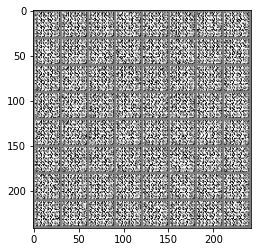


Epoch 100: D:27.669185638427734 | G:26.00098991394043 


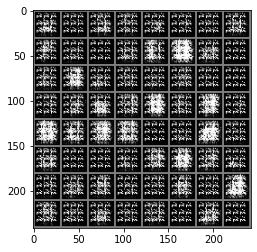


Epoch 200: D:16.469070434570312 | G:10.996410369873047 


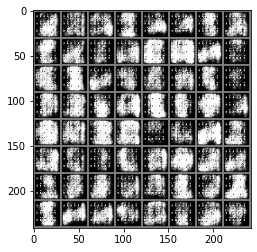


Epoch 300: D:15.965797424316406 | G:5.1265716552734375 


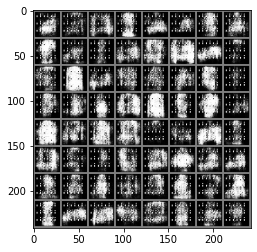


Epoch 400: D:13.720029830932617 | G:7.459243297576904 


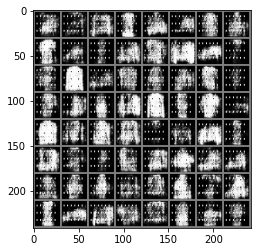


Epoch 500: D:14.665458679199219 | G:7.153112411499023 


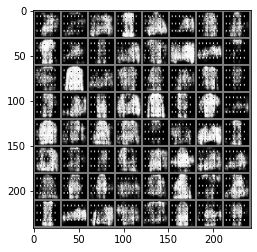


Epoch 600: D:15.621939659118652 | G:7.189590930938721 


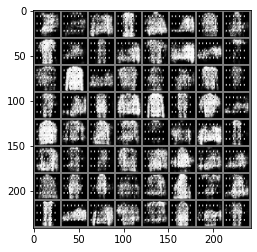


Epoch 700: D:13.913050651550293 | G:8.405778884887695 


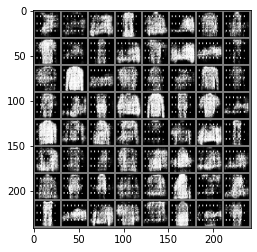


Epoch 800: D:10.131379127502441 | G:5.976569652557373 


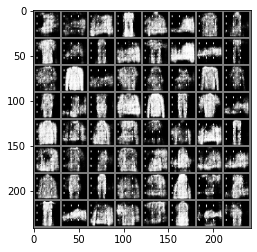


Epoch 900: D:10.127406120300293 | G:5.965853691101074 


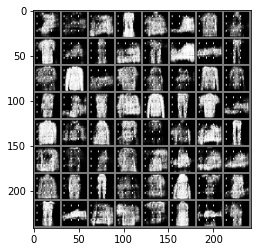


Epoch 1000: D:9.570720672607422 | G:5.748751640319824 


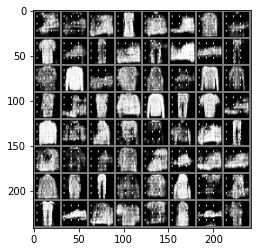


Epoch 1100: D:4.866382122039795 | G:0.9692867994308472 


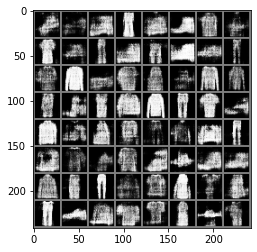


Epoch 1200: D:4.9320502281188965 | G:4.269070625305176 


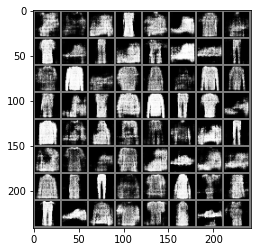


Epoch 1300: D:5.007824420928955 | G:0.9799959063529968 


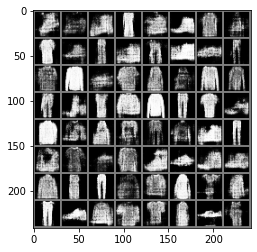


Epoch 1400: D:4.393558979034424 | G:-0.773247241973877 


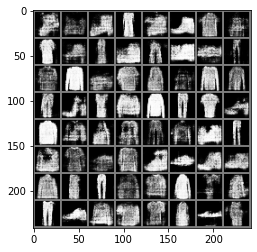


Epoch 1500: D:5.253067493438721 | G:3.939704418182373 


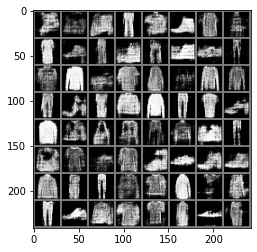


Epoch 1600: D:4.5419440269470215 | G:1.4337924718856812 


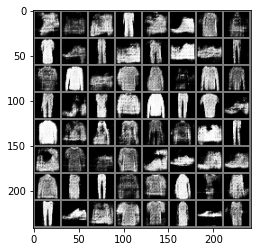


Epoch 1700: D:4.991104602813721 | G:2.094085216522217 


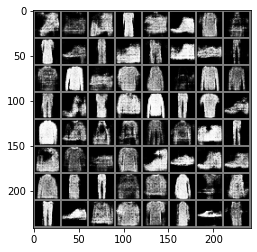


Epoch 1800: D:3.792086601257324 | G:0.9421140551567078 


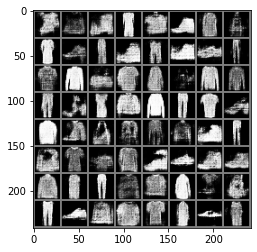


Epoch 1900: D:4.121574878692627 | G:1.4210612773895264 


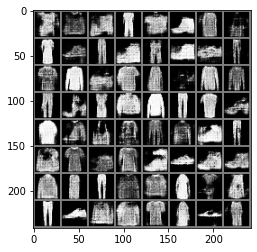


Epoch 2000: D:4.70855188369751 | G:2.2007665634155273 


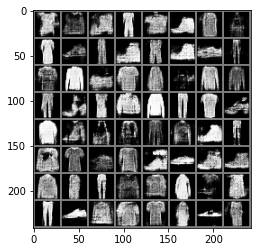


Epoch 2100: D:4.50028133392334 | G:2.081479549407959 


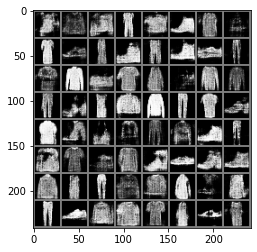


Epoch 2200: D:3.9239559173583984 | G:1.3336913585662842 


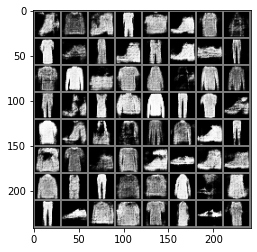


Epoch 2300: D:4.529819488525391 | G:2.9952192306518555 


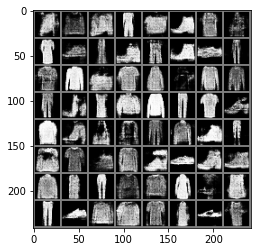


Epoch 2400: D:4.224106311798096 | G:1.278313159942627 


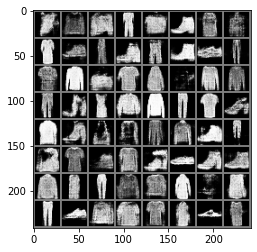


Epoch 2500: D:4.1655683517456055 | G:1.4240186214447021 


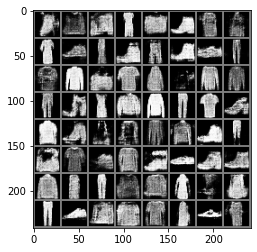


Epoch 2600: D:4.977549076080322 | G:1.1323559284210205 


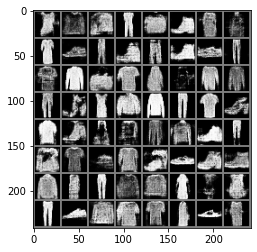


Epoch 2700: D:4.9971022605896 | G:3.3534276485443115 


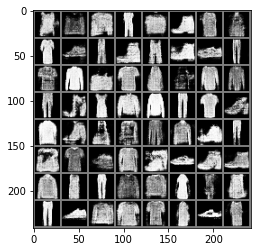


Epoch 2800: D:3.974961757659912 | G:-0.5097856521606445 


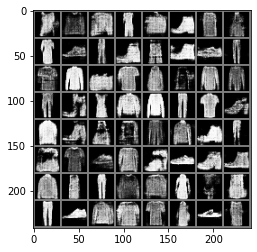


Epoch 2900: D:3.3028342723846436 | G:1.6557515859603882 


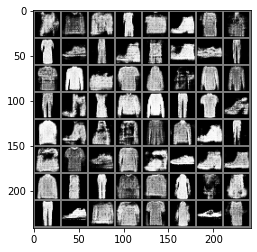


Epoch 3000: D:3.523341178894043 | G:1.276228666305542 


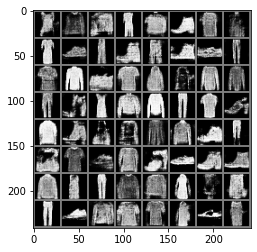

In [ ]:
wgan_results = {}
wgan_results['Generator'] = []
wgan_results['Critic'] = []
fixed_latents = torch.randn((64, WGAN_LATENT_DIM)).to(device)
training_progress_images = []

for iteration in tqdm(range(WGAN_ITERS+1)):
  ## Train critic
  # Allow training critic's parameters
  wgan_cri.train()
  wgan_gen.eval()
  # Perform several critic training iterations
  for i in range(WGAN_CRITIC_ITERS):
    _data = next(iter(train_loader))
    wgan_cri.zero_grad()

    # Train with real
    real = _data[0].to(device)
    d_real = wgan_cri(real)
    # Train with fake
    noisev = torch.randn(WGAN_BATCH_SIZE, WGAN_LATENT_DIM).to(device)
    fake = wgan_gen(noisev)
    d_fake = wgan_cri(fake)

    # Compute losses
    _, disc_loss = wgan_losses(d_fake, d_real)
    gradient_penalty = gp_loss(wgan_cri, real.data, fake.data)
    D_cost = disc_loss + gradient_penalty
    D_cost.backward()
    # Wasserstein_D = disc_loss
    cri_optimizer.step()

  ## Train generator
  wgan_cri.eval()
  wgan_gen.train()
  wgan_gen.zero_grad()
  # Train
  noisev = torch.randn(WGAN_BATCH_SIZE, WGAN_LATENT_DIM).to(device)
  fake = wgan_gen(noisev)
  G = wgan_cri(fake)
  G_cost = -G.mean()
  G_cost.backward()
  gen_optimizer.step()

  #Record results
  wgan_results['Critic'].append(D_cost.item())
  wgan_results['Generator'].append(-G_cost.item())
  with wgan_summary_writer.as_default():
    summary.scalar('WGAN-GP Negative Critic Cost', -D_cost.item(), step=iteration)
    summary.scalar('WGAN-GP Generator Cost', G_cost.item(), step=iteration)

  #Display and save results
  if iteration%10 ==0 :
    results = wgan_gen(fixed_latents)
    img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
    img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
    training_progress_images.append(np.around(255*img_grid).astype(np.uint8))
    if iteration%100 ==0 :
      print(f'\nEpoch {iteration}: D:{-D_cost.item()} | G:{G_cost.item()} ')
      plt.imshow(img_grid)
      plt.show()
    
#Create GIF image
imageio.mimsave('./wgan_training_{}_epochs.gif'.format(WGAN_ITERS+1),
                            training_progress_images)

The network converged immediately. The earlier convergence we witnessed was around 800 iterations, but if often happened later, up to 1200 iterations. We keep training the network for a total of 3000 iterations because empirically the generated images get more visually appealing.

### Train DCGAN

In [ ]:
#Init Tensorboard trackers
current_time = str(datetime.datetime.now().timestamp())
dcgan_log_dir = 'logs/tensorboard/dcgan/' + current_time
dcgan_summary_writer = summary.create_file_writer(dcgan_log_dir)

dcgan_gen = DCGAN_Generator(latent_dim=DCGAN_LATENT_DIM).to(device)
dcgan_cri = DCGAN_Discriminator(latent_dim=DCGAN_LATENT_DIM).to(device)

dcgen_optimizer = optim.Adam(dcgan_gen.parameters(), lr=DCGAN_LR, betas=DCGAN_BETAS)
dccri_optimizer = optim.Adam(dcgan_cri.parameters(), lr=DCGAN_LR, betas=DCGAN_BETAS)


[Batch 0/938]: D:0.5856587290763855 | G:1.281076431274414 


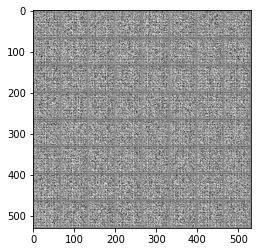


[Batch 100/938]: D:0.0008438378572463989 | G:7.174369812011719 


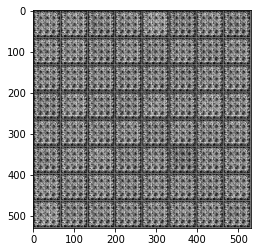


[Batch 200/938]: D:0.0003956239961553365 | G:7.69455623626709 


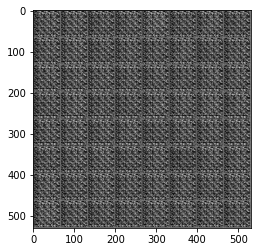


[Batch 300/938]: D:4.225362777709961 | G:14.39627742767334 


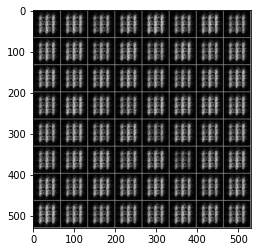


[Batch 400/938]: D:0.11579161882400513 | G:2.5890917778015137 


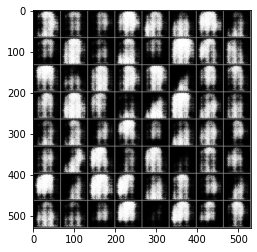


[Batch 500/938]: D:0.1362786442041397 | G:3.1282172203063965 


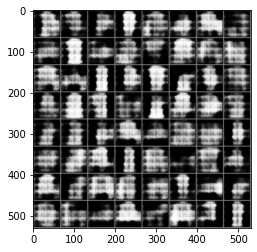


[Batch 600/938]: D:0.16861802339553833 | G:2.645455837249756 


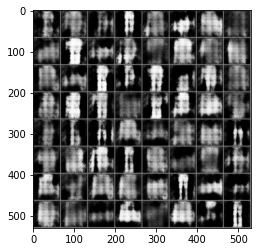


[Batch 700/938]: D:0.6102476716041565 | G:1.4889224767684937 


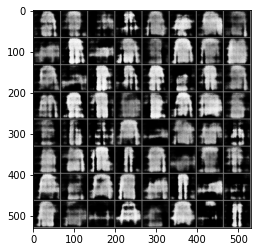


[Batch 800/938]: D:0.22424615919589996 | G:2.257227897644043 


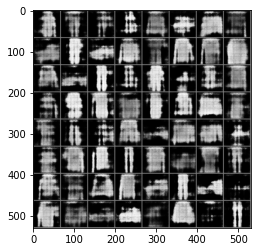


[Batch 900/938]: D:0.055201493203639984 | G:3.476301670074463 


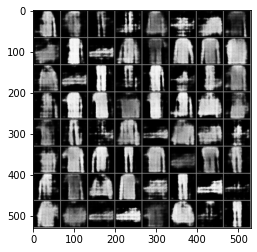


[Batch 0/938]: D:0.15287797152996063 | G:3.380326986312866 


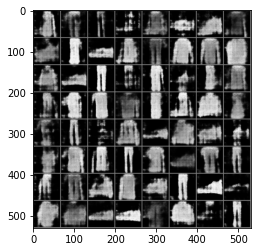


[Batch 100/938]: D:0.1901475042104721 | G:1.9937443733215332 


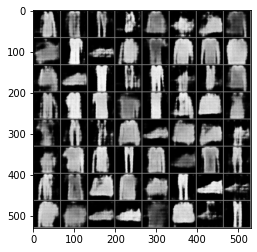


[Batch 200/938]: D:0.015496821142733097 | G:5.56254243850708 


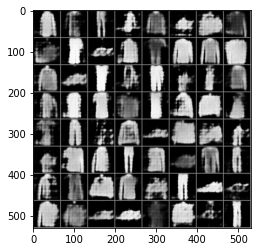


[Batch 300/938]: D:0.048057764768600464 | G:3.988438129425049 


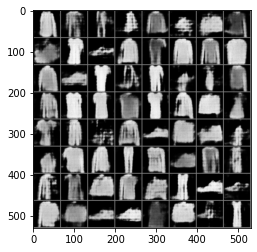


[Batch 400/938]: D:0.11092212051153183 | G:2.937044858932495 


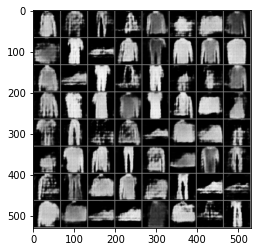


[Batch 500/938]: D:0.39074480533599854 | G:2.8629655838012695 


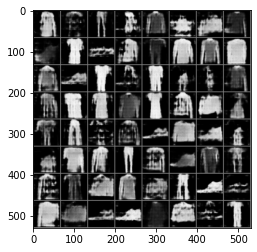


[Batch 600/938]: D:0.08154759556055069 | G:2.829072952270508 


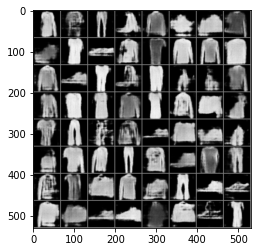


[Batch 700/938]: D:0.16672681272029877 | G:2.5554871559143066 


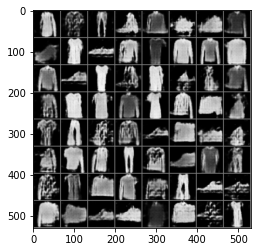


[Batch 800/938]: D:0.43523257970809937 | G:1.1345164775848389 


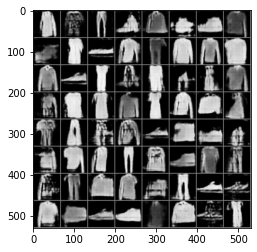


[Batch 900/938]: D:0.10269477963447571 | G:3.306750774383545 


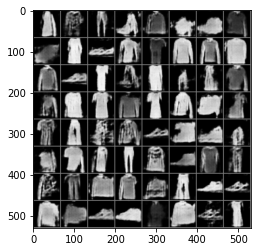


[Batch 0/938]: D:0.2471085637807846 | G:2.39554500579834 


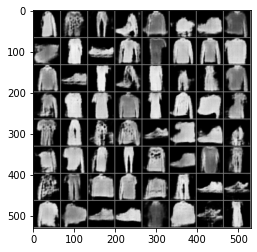


[Batch 100/938]: D:2.2897281646728516 | G:1.1074520349502563 


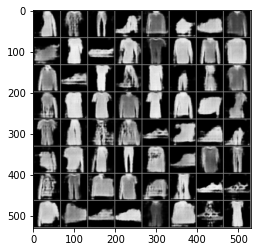


[Batch 200/938]: D:0.09256687015295029 | G:2.893831253051758 


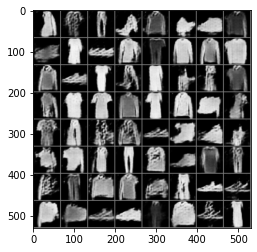


[Batch 300/938]: D:0.33009591698646545 | G:1.6406902074813843 


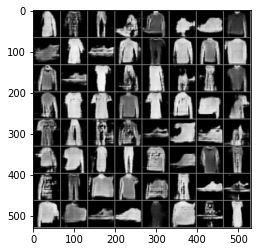


[Batch 400/938]: D:0.05187714099884033 | G:3.7170581817626953 


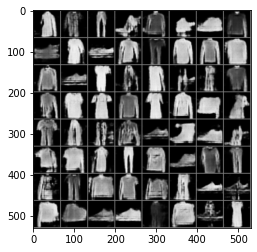


[Batch 500/938]: D:0.028734460473060608 | G:4.148104667663574 


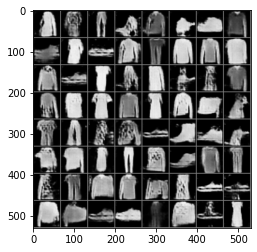


[Batch 600/938]: D:0.04984987527132034 | G:4.085356712341309 


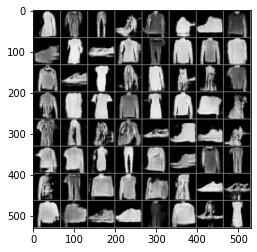


[Batch 700/938]: D:0.037778906524181366 | G:4.249821186065674 


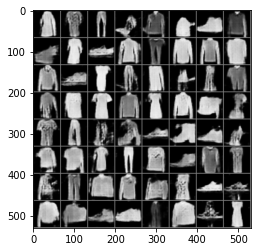


[Batch 800/938]: D:0.12245837599039078 | G:3.993799924850464 


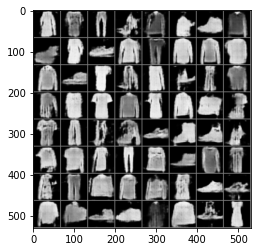


[Batch 900/938]: D:0.2272530198097229 | G:2.1466116905212402 


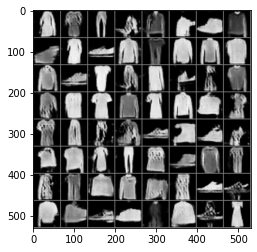


[Batch 0/938]: D:0.02234448306262493 | G:4.810420513153076 


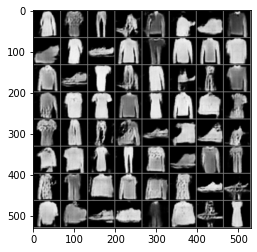


[Batch 100/938]: D:0.04293445870280266 | G:4.578909397125244 


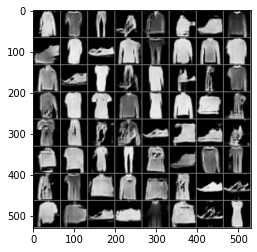


[Batch 200/938]: D:0.03443322330713272 | G:5.179455757141113 


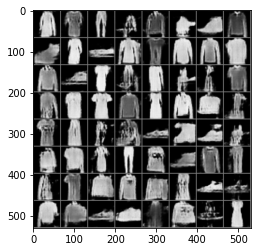


[Batch 300/938]: D:0.06044606864452362 | G:3.1854238510131836 


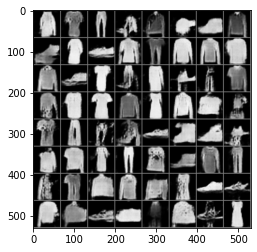


[Batch 400/938]: D:0.018190404400229454 | G:4.198854446411133 


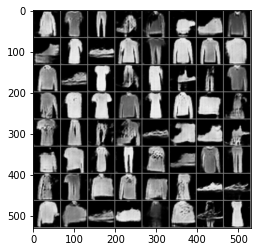


[Batch 500/938]: D:0.07481822371482849 | G:2.9959776401519775 


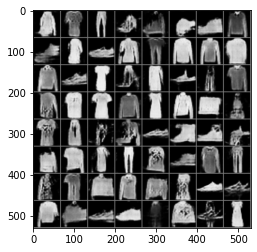


[Batch 600/938]: D:0.11524727940559387 | G:3.482766628265381 


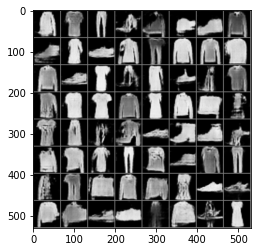


[Batch 700/938]: D:0.2480384111404419 | G:1.8331210613250732 


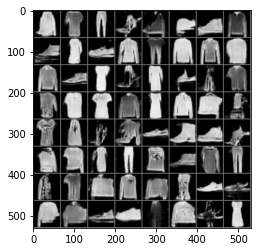


[Batch 800/938]: D:0.00772075355052948 | G:4.847085952758789 


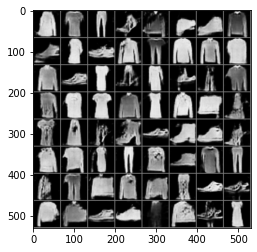


[Batch 900/938]: D:0.011315422132611275 | G:5.4365105628967285 


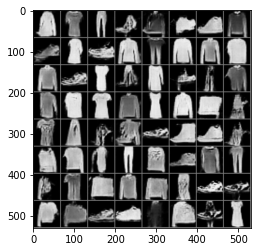


[Batch 0/938]: D:0.061707254499197006 | G:4.544609069824219 


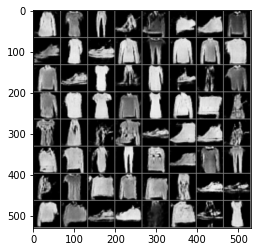


[Batch 100/938]: D:0.01478342805057764 | G:4.592381954193115 


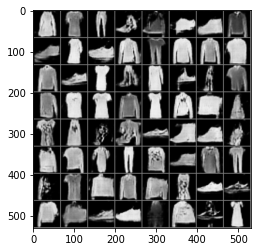


[Batch 200/938]: D:0.22070907056331635 | G:3.324460506439209 


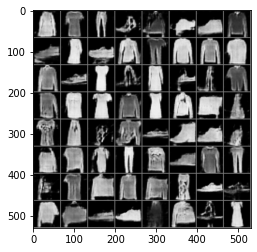


[Batch 300/938]: D:0.021977009251713753 | G:3.8258275985717773 


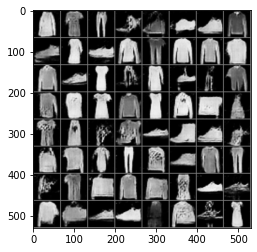


[Batch 400/938]: D:0.01877577230334282 | G:4.671154975891113 


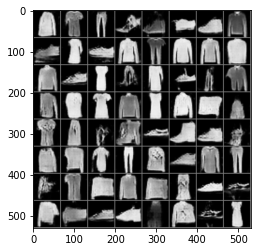


[Batch 500/938]: D:0.12772834300994873 | G:3.1092734336853027 


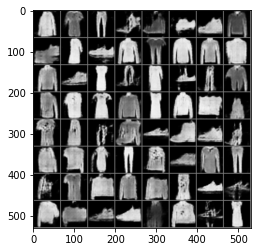


[Batch 600/938]: D:0.035447459667921066 | G:3.8253064155578613 


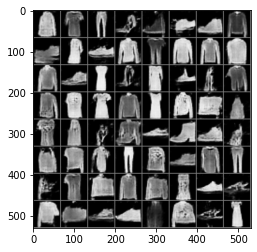


[Batch 700/938]: D:0.03230925276875496 | G:3.353567600250244 


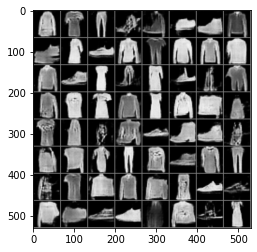


[Batch 800/938]: D:0.19251731038093567 | G:2.454080104827881 


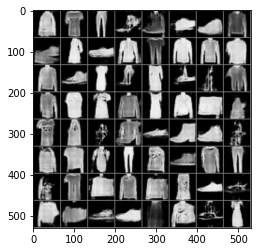


[Batch 900/938]: D:0.019481878727674484 | G:4.224043846130371 


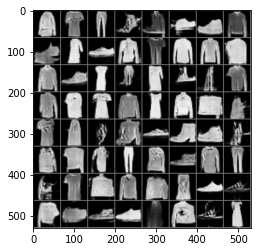


[Batch 0/938]: D:0.010450359433889389 | G:5.131401062011719 


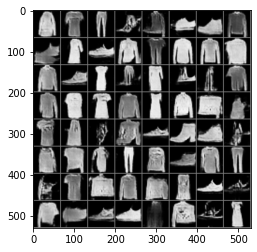


[Batch 100/938]: D:0.08238827437162399 | G:3.7683210372924805 


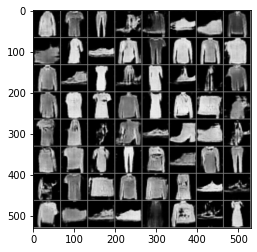


[Batch 200/938]: D:0.06435677409172058 | G:3.875103235244751 


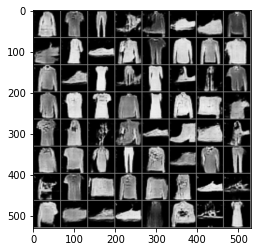


[Batch 300/938]: D:0.018659431487321854 | G:3.930436611175537 


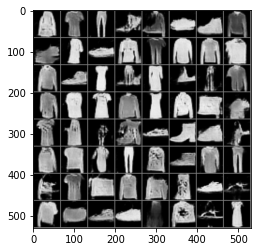


[Batch 400/938]: D:0.002930297050625086 | G:6.290674209594727 


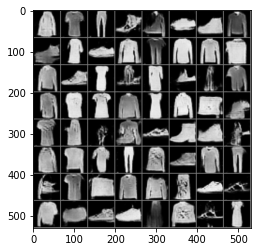


[Batch 500/938]: D:0.010586883872747421 | G:5.042691230773926 


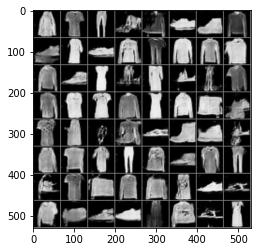


[Batch 600/938]: D:0.01721273362636566 | G:4.116700172424316 


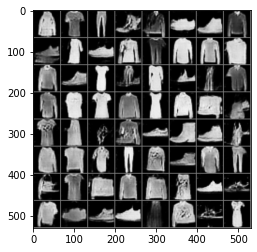


[Batch 700/938]: D:0.8733707070350647 | G:0.6699222326278687 


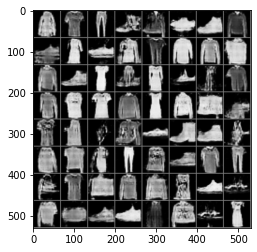


[Batch 800/938]: D:0.012004883959889412 | G:5.004118919372559 


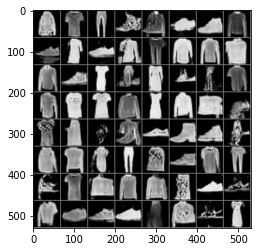


[Batch 900/938]: D:0.026354288682341576 | G:4.337531566619873 


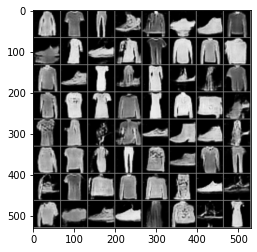

In [ ]:
dcgan_results = {}
dcgan_results['Generator'] = []
dcgan_results['Discriminator'] = []
fixed_latents = torch.randn((64, DCGAN_LATENT_DIM,1,1)).to(device)
training_progress_images = []
loss = nn.BCELoss() #TODO delete

for epoch in tqdm(range(DCGAN_EPOCHS+1)):
  for i, data in enumerate(dcgan_traindata):
    ## Train critic
    # Allow training critic's parameters
    dcgan_cri.zero_grad()
    # Train with real
    data = data[0]
    real = data.to(device)
    d_real = dcgan_cri(real)
    # Train with fake
    noisev = torch.randn(data.size()[0], DCGAN_LATENT_DIM,1,1).to(device)
    fake = dcgan_gen(noisev)
    d_fake = dcgan_cri(fake)
    # Compute losses and optimize
    _, disc_loss = dcgan_losses(d_fake, d_real, loss)
    disc_loss.backward()
    dccri_optimizer.step()

    ## Train generator
    dcgan_gen.zero_grad()
    # Train
    noisev = torch.randn(data.size()[0], DCGAN_LATENT_DIM,1,1).to(device)
    fake = dcgan_gen(noisev)
    d_fake = dcgan_cri(fake)
    gen_loss, disc_loss = dcgan_losses(d_fake, d_real, loss)
    gen_loss.backward()
    dcgen_optimizer.step()

    #Record results
    dcgan_results['Discriminator'].append(disc_loss.item())
    dcgan_results['Generator'].append(gen_loss.item())
    with dcgan_summary_writer.as_default():
      summary.scalar('DCGAN Discriminator Cost', -disc_loss.item(), step=epoch)
      summary.scalar('DCGAN Generator Cost', gen_loss.item(), step=epoch)

    if i%10 == 0:
      #Display and save results
      results = dcgan_gen(fixed_latents)
      img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
      img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
      training_progress_images.append(np.around(255*img_grid).astype(np.uint8))
      if i%100 ==0 :
        print(f'\n[Batch {i}/{len(dcgan_traindata)}]: D:{disc_loss.item()} | G:{gen_loss.item()} ')
        plt.imshow(img_grid)
        plt.show()    

#Create GIF image
imageio.mimsave('./dcgan_training_{}_epochs.gif'.format(DCGAN_EPOCHS+1),
                            training_progress_images)

The network converged immediately. After 5 or 6 epochs the network overfits and the visual quality of the generated images decreases.

## Results

### Losses Comparison

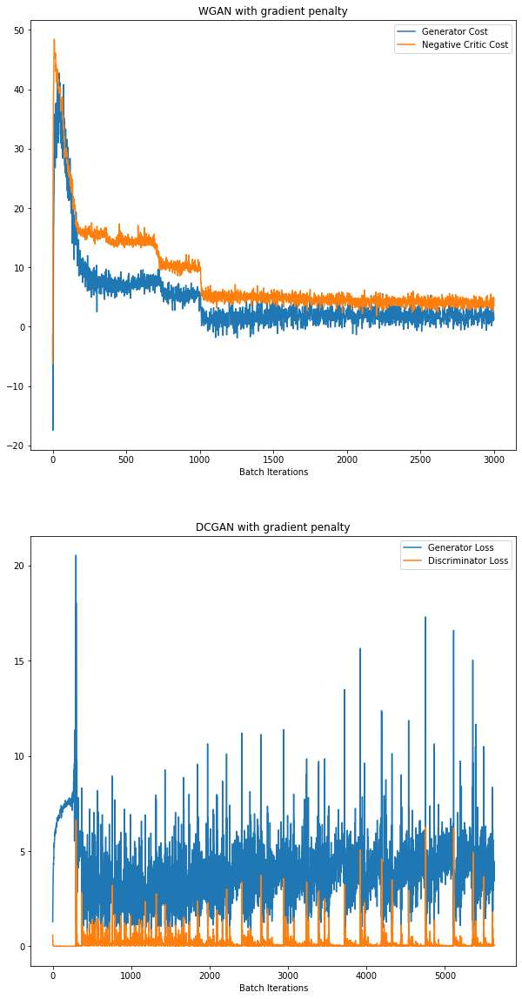

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(10,20))
axs[0].set_title('WGAN with gradient penalty')
axs[0].plot(np.asarray(wgan_results['Generator'])*(-1), label="Generator Cost")
axs[0].plot(np.asarray(wgan_results['Critic'])*(-1), label="Negative Critic Cost")
axs[0].set_xlabel('Batch Iterations')
axs[0].legend()


axs[1].set_title('DCGAN with gradient penalty')
axs[1].plot(dcgan_results['Generator'], label="Generator Loss")
axs[1].plot(dcgan_results['Discriminator'], label="Discriminator Loss")
axs[1].set_xlabel('Batch Iterations')
axs[1].legend()

plt.show()

### Sample generation

WGAN:

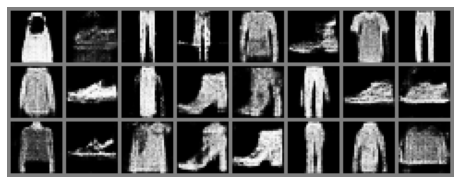

In [ ]:
wgan_gen.eval()
results = wgan_gen(torch.randn((24, WGAN_LATENT_DIM)).to(device))
img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
plt.figure(figsize=(8,16))
plt.imshow(img_grid)
plt.axis('off')
plt.show()

DCGAN:

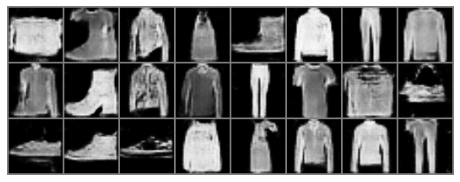

In [ ]:
dcgan_gen.eval()
results = dcgan_gen(torch.randn((24, DCGAN_LATENT_DIM,1,1)).to(device))
img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
plt.figure(figsize=(8,16))
plt.imshow(img_grid)
plt.axis('off')
plt.show()

## Conclusions

Both networks converge consistently and relatively quickly, in term of batch iterations. In wall time the DCGAN trains faster, assumedly because the loss is easier to compute, and in our implementation has less weights (3804032 for DCGAN vs. 5173505 for WGAN).

The WGAN-GP almost always gives good results, but on individual samples it is common to find the DCGAN gives more visually appealing results. In any case their performance is quite similar.

## Save and load models

### Save

In [ ]:
torch.save({'Generator':wgan_gen, 'Critic':wgan_cri, 'Losses' : wgan_results}, "WGAN_GP.pth")
torch.save({'Generator':dcgan_gen, 'Discriminator':dcgan_cri, 'Losses' : dcgan_results}, "DCGAN.pth")

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:402: UserWarning: Couldn't retrieve source code for container of type WGAN_Generator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:402: UserWarning: Couldn't retrieve source code for container of type WGAN_Critic. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:402: UserWarning: Couldn't retrieve source code for container of type DCGAN_Generator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:402: UserWarning: Couldn't retrieve source code for container of type DCGAN_Discriminator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked

### Load and test

Before loading make sure the "Setup" section above has been run, and that the files (which should be in the current Drive folder) have been uploaded to the Colab runtime.

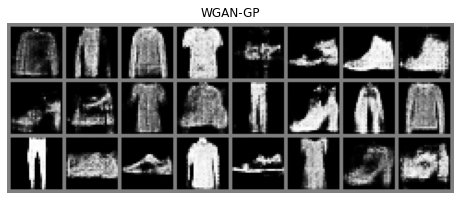

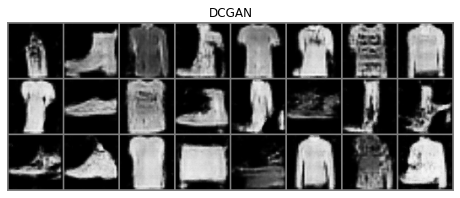

In [ ]:
wgan_loaded = torch.load("WGAN_GP.pth")
wgan_gen_loaded = wgan_loaded['Generator']
wgan_gen_loaded.eval()

dcgan_loaded = torch.load("DCGAN.pth")
dcgan_gen_loaded = dcgan_loaded['Generator']
dcgan_gen_loaded.eval()

results = wgan_gen_loaded(torch.randn((24, WGAN_LATENT_DIM)).to(device))
img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
plt.figure(figsize=(8,16))
plt.imshow(img_grid)
plt.axis('off')
plt.title('WGAN-GP')
plt.show()

results = dcgan_gen_loaded(torch.randn((24, DCGAN_LATENT_DIM, 1, 1)).to(device))
img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
plt.figure(figsize=(8,16))
plt.imshow(img_grid)
plt.axis('off')
plt.title('DCGAN')
plt.show()

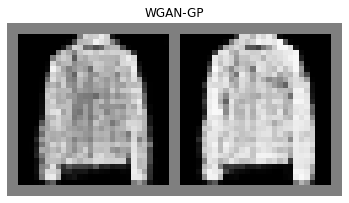

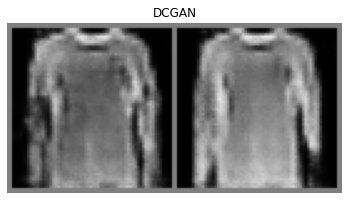

In [ ]:
input1 = torch.randn((1, WGAN_LATENT_DIM))
input2 = input1 + 0.5*torch.randn((1, WGAN_LATENT_DIM))
inputs = torch.cat((input1, input2), axis=0)
results = wgan_gen_loaded(inputs.to(device))
img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
plt.figure()
plt.imshow(img_grid)
plt.axis('off')
plt.title('WGAN-GP')
plt.show()

inputs = torch.unsqueeze(inputs, -1)
inputs = torch.unsqueeze(inputs, -1)
results = dcgan_gen_loaded(inputs.to(device))
img_grid = torchvision.utils.make_grid(results).cpu().detach().numpy()
img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
plt.figure()
plt.imshow(img_grid)
plt.axis('off')
plt.title('DCGAN')
plt.show()

In [ ]:
torch.save({'input1':input1, 'input2':input2}, "shirt_inputs.pth")

We get some original images from the FashionMNIST dataset:

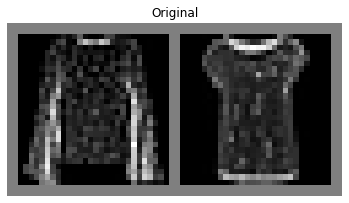

In [ ]:
samples, labels = iter(train_loader).next()
# print(samples.shape)
kk = (labels == 6)
samples_shirt = samples[kk]
samples_shirt = samples_shirt[:2]

# print(samples_shirt.shape)
img_grid = torchvision.utils.make_grid(samples_shirt).cpu().detach().numpy()
img_grid = np.transpose(img_grid, (1, 2, 0))*.5 +.5
plt.figure()
plt.imshow(img_grid)
plt.axis('off')
plt.title('Original')
plt.show()